<a href="https://colab.research.google.com/github/hanmrf/MachineLearning/blob/main/Tomato.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Impor Library

In [ ]:
# Impor library yang dibutuhkan
import os
import random
import shutil
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau
from PIL import Image, ImageDraw, ImageOps
import seaborn as sns

# Library khusus untuk Google Colab (hanya digunakan jika di Colab)
from google.colab import files

2. Download Dataset

In [ ]:
!chmod 600 /content/kaggle.json

chmod: cannot access '/content/kaggle.json': No such file or directory


In [ ]:
! KAGGLE_CONFIG_DIR=/content/ kaggle datasets download muhammadraihanf12/agricurify-tomatov2

Dataset URL: https://www.kaggle.com/datasets/muhammadraihanf12/agricurify-tomatov2
License(s): unknown
 96% 214M/224M [00:04<00:00, 73.7MB/s]
100% 224M/224M [00:04<00:00, 56.8MB/s]


3. Ekstraksi Dataset

In [ ]:
import zipfile

# Lokasi file ZIP
zip_file_path = "/content/agricurify-tomatov2.zip"
extract_to_path = "/content/"

# Mengekstrak file ZIP
if os.path.exists(zip_file_path):
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to_path)
        print("File berhasil diekstrak ke direktori:", extract_to_path)
else:
    print("File ZIP tidak ditemukan di lokasi:", zip_file_path)

File berhasil diekstrak ke direktori: /content/


4. Analisis Dataset

In [ ]:
# Daftar direktori dataset
dataset_dirs = [
    "/content/Not_Tomato",
    "/content/Tomato___Bacterial_spot",
    "/content/Tomato___Leaf_Mold",
    "/content/Tomato___Septoria_leaf_spot",
    "/content/Tomato___Spider_mites Two-spotted_spider_mite",
    "/content/Tomato___Tomato_Yellow_Leaf_Curl_Virus",
    "/content/Tomato___Tomato_mosaic_virus",
    "/content/Tomato___healthy"
]

# Direktori tujuan untuk dataset gabungan
merged_dataset_dir = "/content/Merged_Tomato"

# Buat direktori tujuan jika belum ada
os.makedirs(merged_dataset_dir, exist_ok=True)

# Salin gambar dari setiap direktori dataset ke direktori tujuan, pertahankan struktur kelas
for dataset_dir in dataset_dirs:
    # Dapatkan nama kelas dari nama direktori
    class_name = os.path.basename(dataset_dir)

    # Buat sub-direktori kelas di direktori tujuan jika belum ada
    target_class_dir = os.path.join(merged_dataset_dir, class_name)
    os.makedirs(target_class_dir, exist_ok=True)

    # Salin gambar dari direktori dataset ke sub-direktori kelas di direktori tujuan
    for filename in os.listdir(dataset_dir):
        src_path = os.path.join(dataset_dir, filename)
        dst_path = os.path.join(target_class_dir, filename)
        shutil.copy(src_path, dst_path)

print("Dataset telah digabungkan ke:", merged_dataset_dir)

Dataset telah digabungkan ke: /content/Merged_Tomato


In [ ]:
tomato_data = "/content/Merged_Tomato"
tomato_classes = os.listdir(tomato_data)

print("tomato_classes:")
for classes in tomato_classes:
    if os.path.isdir(os.path.join(tomato_data, classes)):
        print(classes)

tomato_classes:
Tomato___Spider_mites Two-spotted_spider_mite
Tomato___Tomato_Yellow_Leaf_Curl_Virus
Not_Tomato
Tomato___Septoria_leaf_spot
Tomato___Tomato_mosaic_virus
Tomato___healthy
Tomato___Bacterial_spot
Tomato___Leaf_Mold



Class Name: Tomato___Spider_mites Two-spotted_spider_mite
Total Images: 1741
Resolution of First Image: (256, 256, 3)


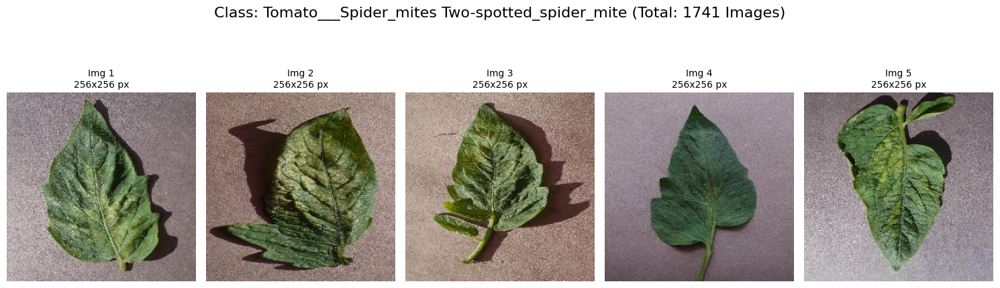


Class Name: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Total Images: 1961
Resolution of First Image: (256, 256, 3)


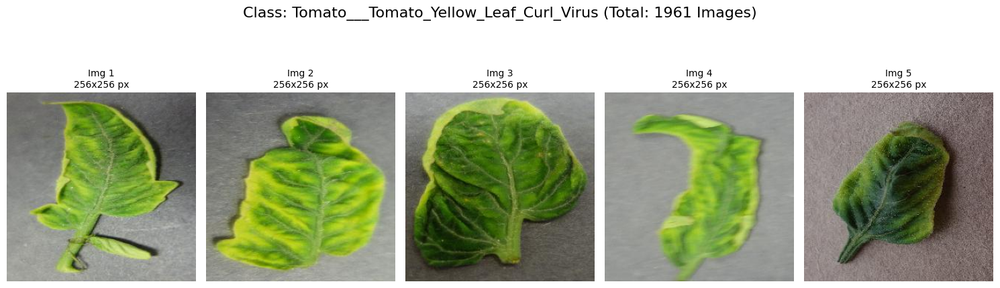


Class Name: Not_Tomato
Total Images: 1027
Resolution of First Image: (256, 382, 3)


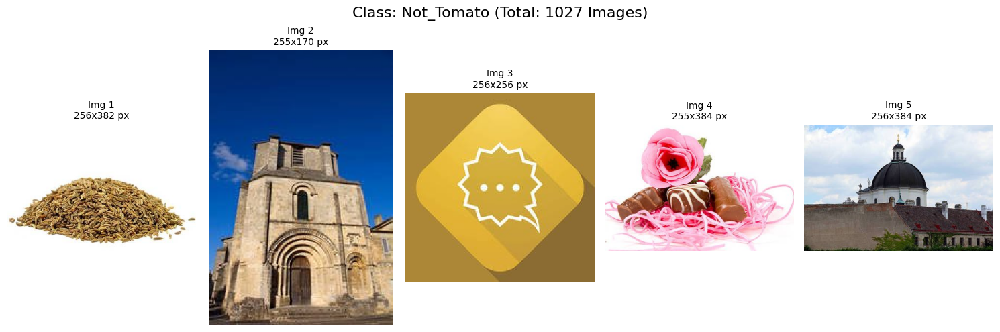


Class Name: Tomato___Septoria_leaf_spot
Total Images: 1745
Resolution of First Image: (256, 256, 3)


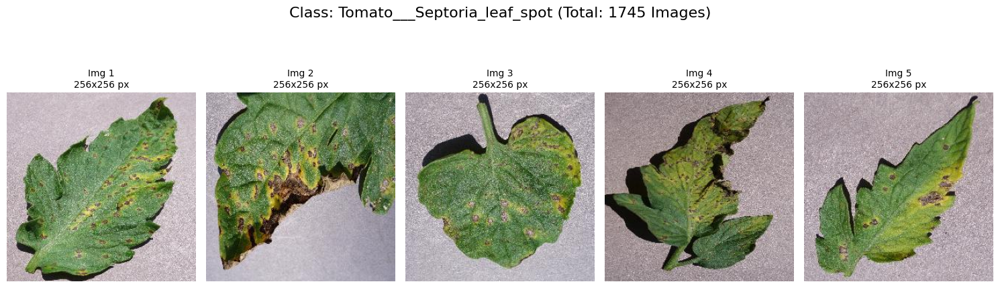


Class Name: Tomato___Tomato_mosaic_virus
Total Images: 1790
Resolution of First Image: (256, 256, 3)


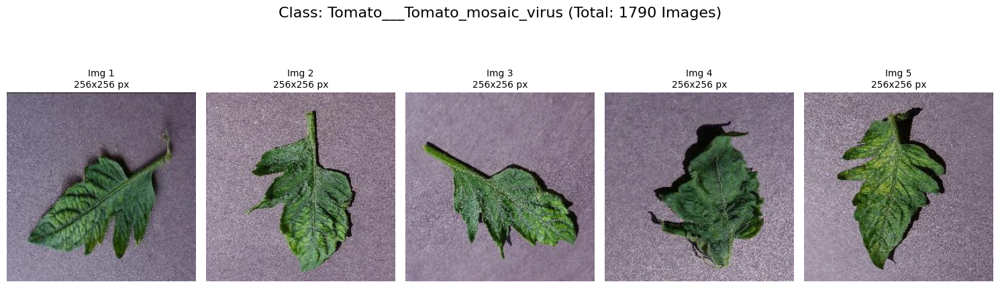


Class Name: Tomato___healthy
Total Images: 1926
Resolution of First Image: (256, 256, 3)


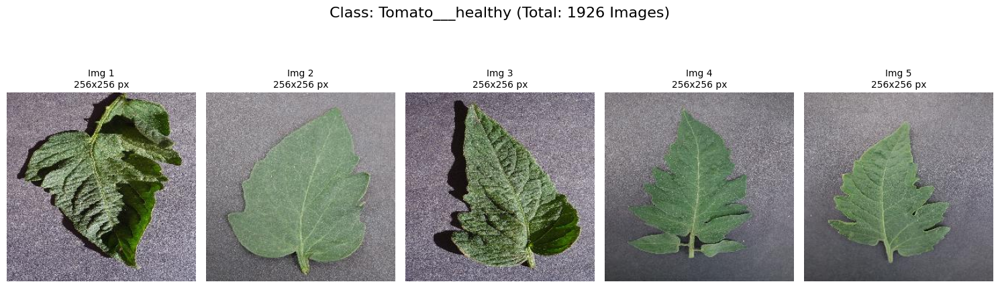


Class Name: Tomato___Bacterial_spot
Total Images: 1702
Resolution of First Image: (256, 256, 3)


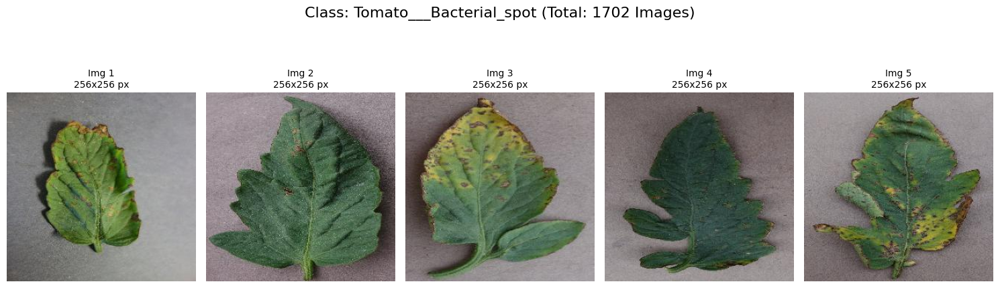


Class Name: Tomato___Leaf_Mold
Total Images: 1882
Resolution of First Image: (256, 256, 3)


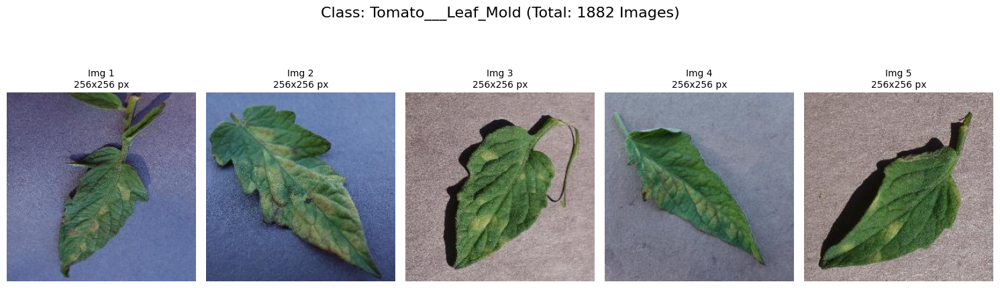

In [ ]:
for item in tomato_classes:
    print("\nClass Name:", item)
    class_dir = os.path.join(tomato_data, item)
    class_images = os.listdir(class_dir)

    # Total images in each class
    num_images = len(class_images)
    print("Total Images:", num_images)

    # Resolution/size of the first image in the class
    img_path = os.path.join(class_dir, class_images[0])
    img = mpimg.imread(img_path)
    image_shape = img.shape
    print("Resolution of First Image:", image_shape)

    # Displaying some images with descriptive labels
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Class: {item} (Total: {num_images} Images)", fontsize=16)

    for i, img_file in enumerate(class_images[:5]):  # Display up to 5 images
        img_path = os.path.join(class_dir, img_file)
        img = mpimg.imread(img_path)

        # Add a subplot for each image
        sp = plt.subplot(1, 5, i + 1)
        plt.axis('off')
        plt.imshow(img)

        # Add descriptive title to each image
        plt.title(f"Img {i+1}\n{img.shape[0]}x{img.shape[1]} px", fontsize=10)

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Adjust to fit the suptitle
    plt.show()

5. Preprocessing Data

In [ ]:
# New Directory for Balanced and Finalizing Dataset
Final_data_dir = "/content/Final_data"

# Number of Images to Be Selected from Each Class
num_images_per_class = min(
    len(os.listdir(os.path.join(tomato_data, "Tomato___Bacterial_spot"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Spider_mites Two-spotted_spider_mite"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Leaf_Mold"))),
    len(os.listdir(os.path.join(tomato_data, "Not_Tomato"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Septoria_leaf_spot"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Tomato_mosaic_virus"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___healthy"))),
    len(os.listdir(os.path.join(tomato_data, "Tomato___Tomato_Yellow_Leaf_Curl_Virus")))
)

# Create New Directory in Final_data_dir
for class_name in tomato_classes:
    os.makedirs(os.path.join(Final_data_dir, class_name), exist_ok=True)

# Select Some Images from Each Class and Copy to Final_data_dir
for class_name in tomato_classes:
    source_dir = os.path.join(tomato_data, class_name)
    destination_dir = os.path.join(Final_data_dir, class_name)

    # Get a list of image files in the source directory
    image_files = os.listdir(source_dir)

    # Select a subset of images (up to num_images_per_class)
    selected_images = image_files[:num_images_per_class]

    # Copy the selected images to the destination directory
    for image_file in selected_images:
        shutil.copy(os.path.join(source_dir, image_file), destination_dir)

print(f"Final_data dataset created in: {Final_data_dir}")

Final_data dataset created in: /content/Final_data


Preview Final Dataset:

Kelas: Tomato___Spider_mites Two-spotted_spider_mite
Total Gambar: 1027


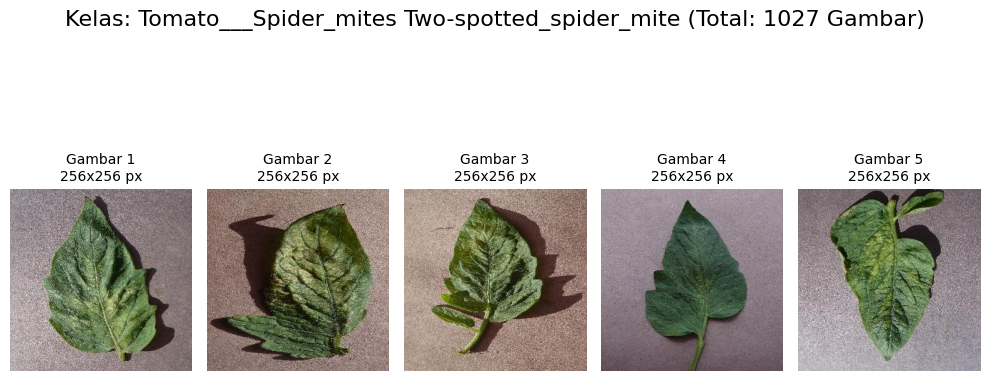


Kelas: Tomato___Tomato_Yellow_Leaf_Curl_Virus
Total Gambar: 1027


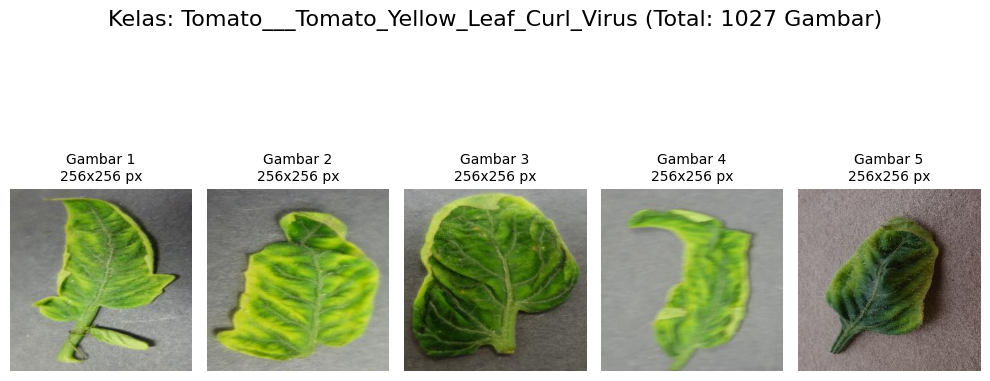


Kelas: Not_Tomato
Total Gambar: 1027


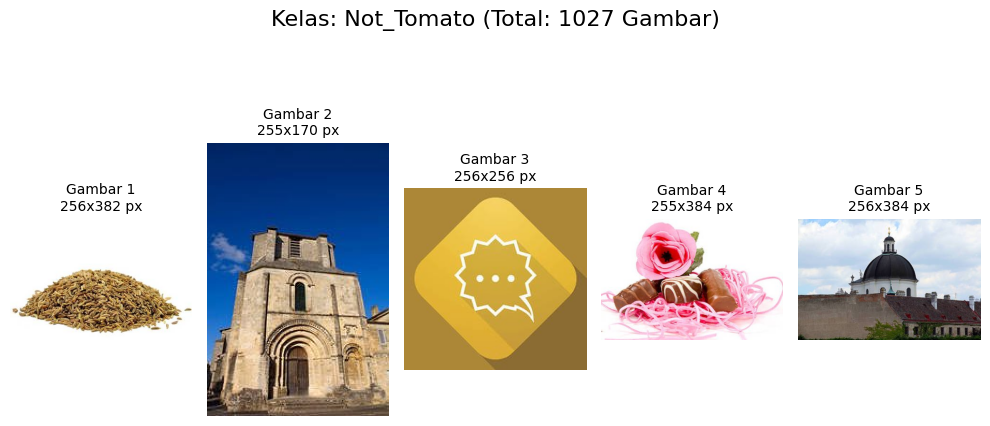


Kelas: Tomato___Septoria_leaf_spot
Total Gambar: 1027


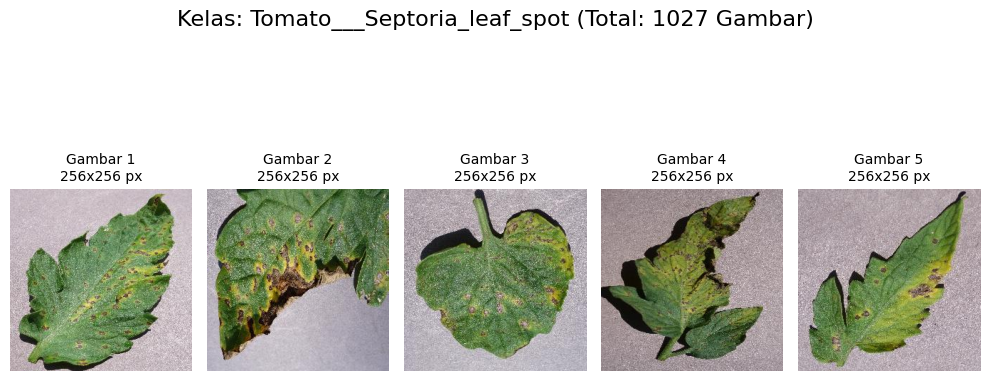


Kelas: Tomato___Tomato_mosaic_virus
Total Gambar: 1027


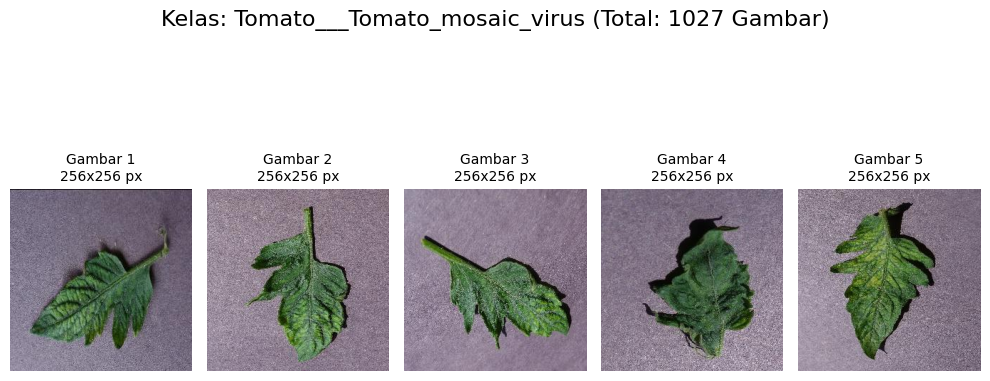


Kelas: Tomato___healthy
Total Gambar: 1027


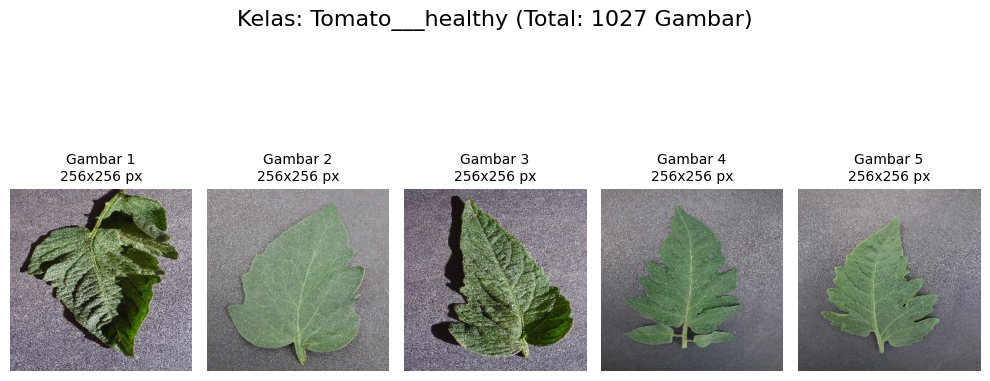


Kelas: Tomato___Bacterial_spot
Total Gambar: 1027


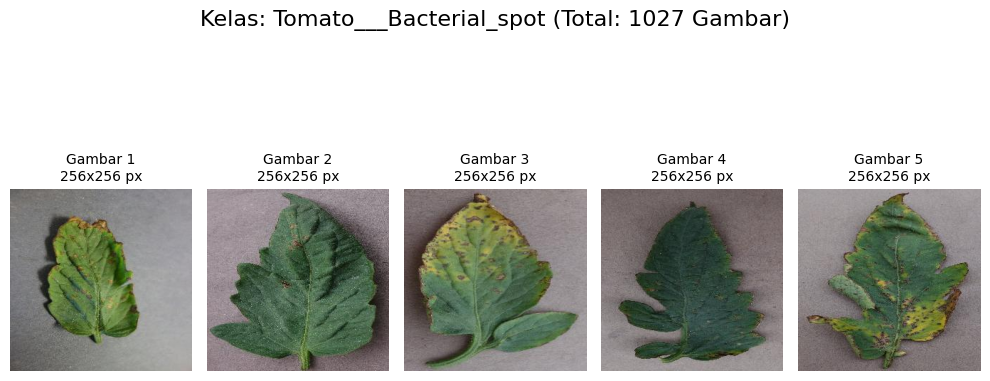


Kelas: Tomato___Leaf_Mold
Total Gambar: 1027


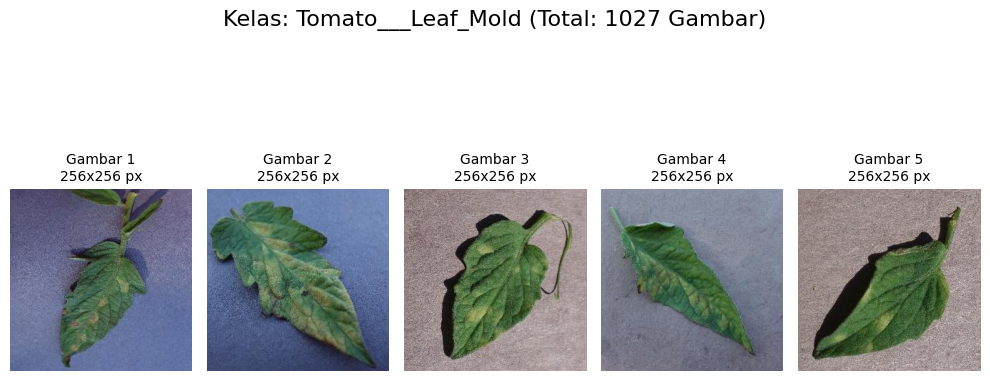

In [ ]:
# Preview Gambar dari Final dataset
print("Preview Final Dataset:")

for class_name in tomato_classes:
    print(f"\nKelas: {class_name}")

    # Direktori kelas
    class_dir = os.path.join(Final_data_dir, class_name)

    # Daftar gambar dalam kelas
    class_images = os.listdir(class_dir)

    # Total gambar dalam kelas
    num_images = len(class_images)
    print(f"Total Gambar: {num_images}")

    # Menampilkan beberapa gambar dari kelas
    plt.figure(figsize=(10, 5))
    plt.suptitle(f"Kelas: {class_name} (Total: {num_images} Gambar)", fontsize=16)

    for i, image_file in enumerate(class_images[:5]):  # Menampilkan hingga 5 gambar
        image_path = os.path.join(class_dir, image_file)
        image = mpimg.imread(image_path)

        # Menambahkan subplot untuk setiap gambar
        plt.subplot(1, 5, i + 1)
        plt.axis('off')
        plt.imshow(image)

        # Menambahkan judul deskriptif ke setiap gambar
        plt.title(f"Gambar {i + 1}\n{image.shape[0]}x{image.shape[1]} px", fontsize=10)

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Menyesuaikan untuk judul utama
    plt.show()

6. Split Model

In [ ]:
# Dataset directory and class names
dataset_dir = "/content/Final_data"
classes = [
    "Tomato___Bacterial_spot",
    "Tomato___Spider_mites Two-spotted_spider_mite",
    "Tomato___Leaf_Mold",
    "Not_Tomato",
    "Tomato___Septoria_leaf_spot",
    "Tomato___Tomato_mosaic_virus",
    "Tomato___healthy",
    "Tomato___Tomato_Yellow_Leaf_Curl_Virus"
]

# Ratios for splitting data
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Process each class
for class_name in classes:
    # Define class directory and fetch files
    class_dir = os.path.join(dataset_dir, class_name)
    files = os.listdir(class_dir)
    random.shuffle(files)

    # Calculate split sizes
    num_files = len(files)

    # Ensure there are enough files for each split
    if num_files < 3:
        print(f"Not enough files in {class_name} to split into train, val, and test sets.")
        continue

    num_train = max(1, int(num_files * train_ratio))
    num_val = max(1, int(num_files * val_ratio))
    num_test = num_files - num_train - num_val

    # Adjust if necessary to ensure all splits are non-empty
    if num_test < 1:
        num_test = 1
        num_val = num_files - num_train - num_test

    if num_val < 1:
        num_val = 1
        num_test = num_files - num_train - num_val

    # Split files into train, validation, and test sets
    train_files = files[:num_train]
    val_files = files[num_train:num_train + num_val]
    test_files = files[num_train + num_val:]

    # Move files to respective folders
    for folder_name, file_list in [("train", train_files), ("val", val_files), ("test", test_files)]:
        folder_path = os.path.join(dataset_dir, folder_name, class_name)
        os.makedirs(folder_path, exist_ok=True)

        for file in file_list:
            src = os.path.join(class_dir, file)
            dst = os.path.join(folder_path, file)
            shutil.move(src, dst)

In [ ]:
# Directory paths
train_dir = '/content/Final_data/train'
val_dir = '/content/Final_data/val'
test_dir = '/content/Final_data/test'

# Image size yang sesuai dengan MobileNetV2 input
img_size = 224
batch_size = 32

# Augmentasi data
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1.0/255)

# Generator data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Class weights untuk menangani imbalance
y_train = train_generator.classes
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = {i: weight for i, weight in enumerate(class_weights)}

Found 6568 images belonging to 8 classes.
Found 816 images belonging to 8 classes.
Found 832 images belonging to 8 classes.


7. Membuat Model

In [ ]:
# Inisialisasi MobileNetV2 pre-trained
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_size, img_size, 3))
base_model.trainable = False  # Freeze semua layer

# Membuat model baru
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu', kernel_regularizer=l2(0.01)),
    layers.Dropout(0.4),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(8, activation='softmax')  # 10 kelas
])

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 8)                   │           2,056 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,047,240 (11.62 MB)

 Trainable params: 789,256 (3.01 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

# Training model
history = model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[lr_scheduler],
    verbose=1
)

# Evaluasi model pada data val
val_loss, val_acc = model.evaluate(val_generator)
print(f'Validation accuracy: {val_acc * 100:.2f}%')

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


206/206 ━━━━━━━━━━━━━━━━━━━━ 133s 568ms/step - accuracy: 0.5874 - loss: 5.3490 - val_accuracy: 0.8615 - val_loss: 1.4047 - learning_rate: 0.0010
Epoch 2/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 121s 506ms/step - accuracy: 0.7994 - loss: 1.3752 - val_accuracy: 0.9081 - val_loss: 0.7878 - learning_rate: 0.0010
Epoch 3/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 106s 502ms/step - accuracy: 0.8247 - loss: 0.9370 - val_accuracy: 0.8873 - val_loss: 0.7077 - learning_rate: 0.0010
Epoch 4/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 107s 505ms/step - accuracy: 0.8282 - loss: 0.8239 - val_accuracy: 0.9105 - val_loss: 0.5881 - learning_rate: 0.0010
Epoch 5/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 142s 499ms/step - accuracy: 0.8479 - loss: 0.7490 - val_accuracy: 0.8787 - val_loss: 0.6515 - learning_rate: 0.0010
Epoch 6/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 108s 505ms/step - accuracy: 0.8516 - loss: 0.7185 - val_accuracy: 0.8971 - val_loss: 0.5686 - learning_rate: 0.0010
Epoch 7/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 106s 502ms/step - accuracy: 0.8496 

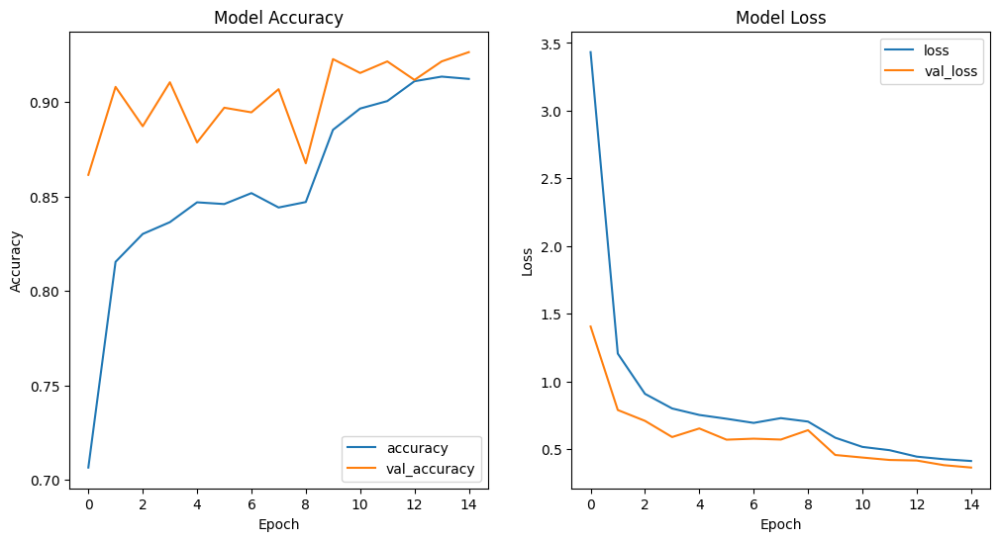

In [ ]:
# Plotting accuracy and loss
plt.figure(figsize=(12, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.show()

Found 832 images belonging to 8 classes.
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step


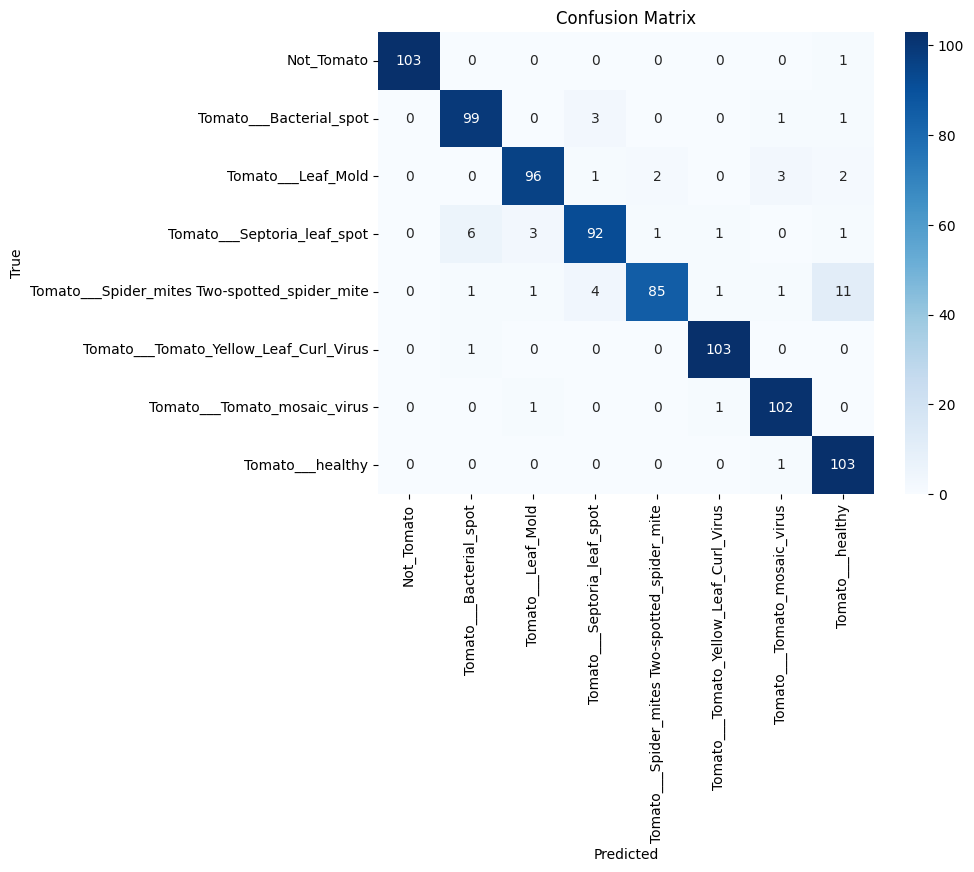

In [ ]:
# Confusion Matrix (untuk data testing)
test_generator = val_test_datagen.flow_from_directory(test_dir, target_size=(img_size, img_size), batch_size=batch_size, class_mode='categorical', shuffle=False)

# Prediksi dengan model yang telah dilatih
test_preds = model.predict(test_generator, verbose=1)
test_preds = np.argmax(test_preds, axis=1)

# Confusion matrix
cm = confusion_matrix(test_generator.classes, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

8. Fine Tuning

In [ ]:
# Unfreeze beberapa layer terakhir dari base model
base_model.trainable = True
for layer in base_model.layers[-30:]:  # Ubah angka -20 untuk mengatur jumlah layer yang di-unfreeze
    layer.trainable = False

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Fine-tuning training
history_fine_tune = model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[lr_scheduler],
    verbose=1
)

Epoch 1/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 181s 649ms/step - accuracy: 0.8093 - loss: 0.9949 - val_accuracy: 0.7525 - val_loss: 0.8672 - learning_rate: 1.0000e-04
Epoch 2/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 110s 522ms/step - accuracy: 0.9444 - loss: 0.3161 - val_accuracy: 0.7868 - val_loss: 0.7768 - learning_rate: 1.0000e-04
Epoch 3/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 113s 522ms/step - accuracy: 0.9653 - loss: 0.2435 - val_accuracy: 0.8039 - val_loss: 0.7432 - learning_rate: 1.0000e-04
Epoch 4/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 111s 524ms/step - accuracy: 0.9636 - loss: 0.2354 - val_accuracy: 0.9608 - val_loss: 0.2290 - learning_rate: 1.0000e-04
Epoch 5/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 111s 526ms/step - accuracy: 0.9734 - loss: 0.1911 - val_accuracy: 0.9326 - val_loss: 0.3040 - learning_rate: 1.0000e-04
Epoch 6/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 112s 519ms/step - accuracy: 0.9810 - loss: 0.1742 - val_accuracy: 0.9583 - val_loss: 0.2250 - learning_rate: 1.0000e-04
Epoch 7/15
206/206 ━━━━━━━━━━━━━━━━━━━━ 

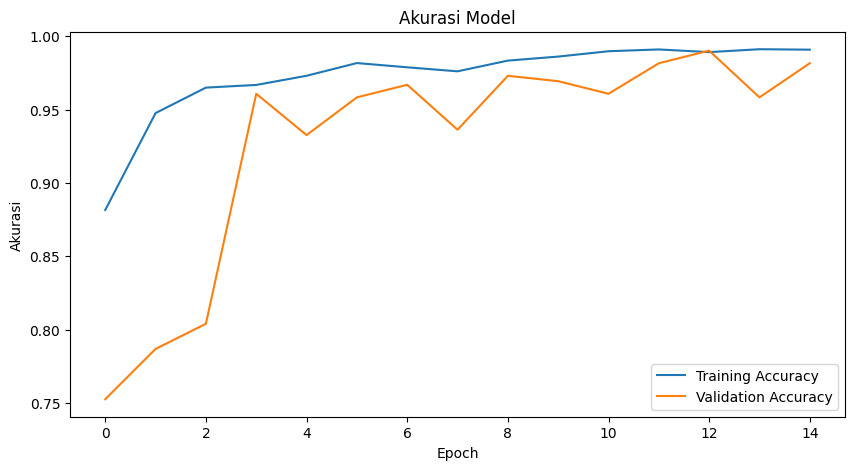

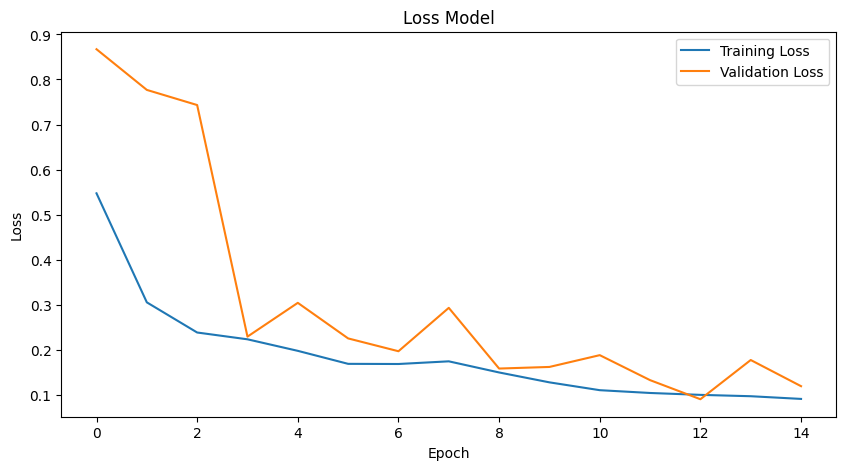

In [ ]:
# Plot Akurasi after fine tuning
plt.figure(figsize=(10, 5))
plt.plot(history_fine_tune.history['accuracy'], label='Training Accuracy')
plt.plot(history_fine_tune.history['val_accuracy'], label='Validation Accuracy')
plt.title('Akurasi Model')
plt.ylabel('Akurasi')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

# Plot Loss
plt.figure(figsize=(10, 5))
plt.plot(history_fine_tune.history['loss'], label='Training Loss')
plt.plot(history_fine_tune.history['val_loss'], label='Validation Loss')
plt.title('Loss Model')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.show()

26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step


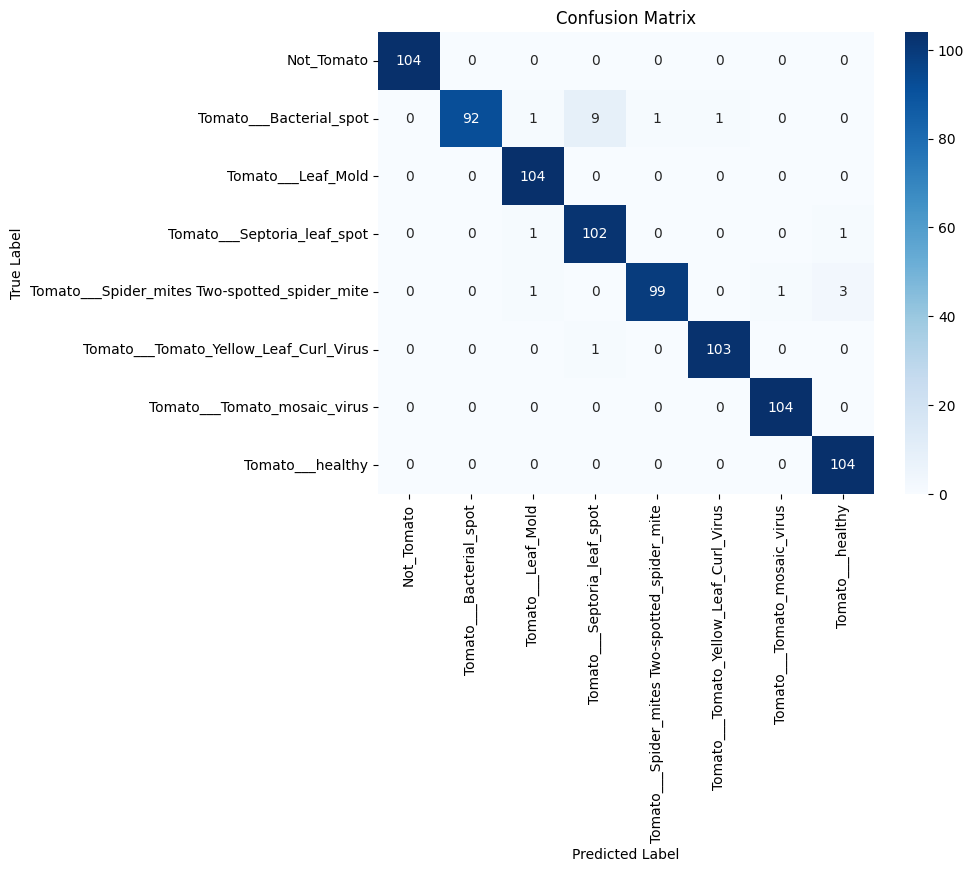

In [ ]:
# Prediksi pada data test
test_predictions = model.predict(test_generator, verbose=1)
test_predictions = np.argmax(test_predictions, axis=1)  # Get predicted class labels

# Dapatkan true labels dari test generator
true_labels = test_generator.classes

# Buat confusion matrix setelah fine tuning
cm = confusion_matrix(true_labels, test_predictions)

# Visualisasi confusion matrix menggunakan seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

9. Test Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


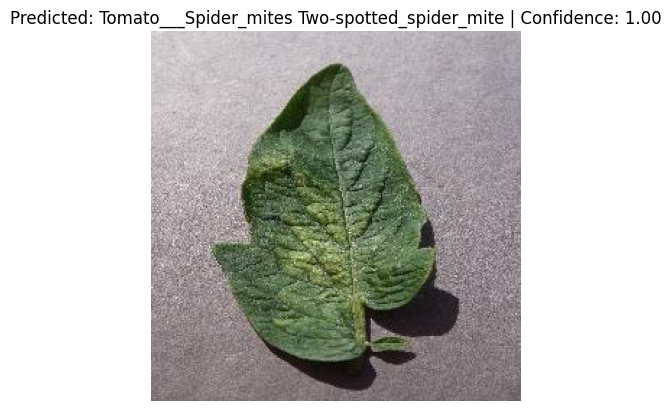

In [ ]:
# Test Gambar Dataset
# Fungsi untuk prediksi gambar
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/Tomato___Spider_mites Two-spotted_spider_mite/003b7929-a364-4e74-be1c-37c4c0a6ec63___Com.G_SpM_FL 1414.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


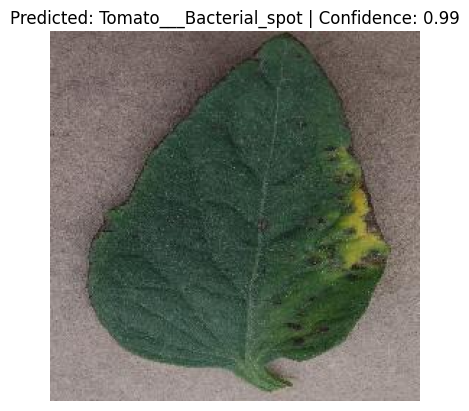

In [ ]:
# Test Gambar Dataset
# Fungsi untuk prediksi gambar
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/Tomato___Bacterial_spot/01375198-62af-4c40-bddf-f3c11107200b___GCREC_Bact.Sp 5914.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


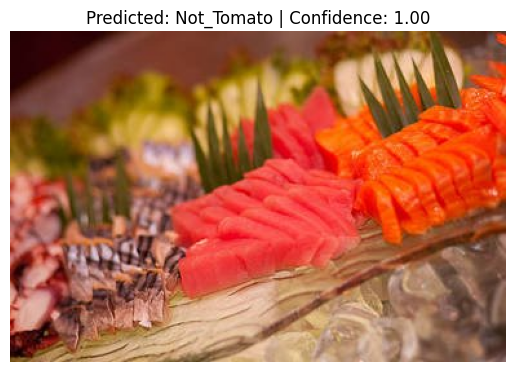

In [ ]:
# Test Gambar Dataset
# Fungsi untuk prediksi gambar
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/Not_Tomato/102.jpg'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


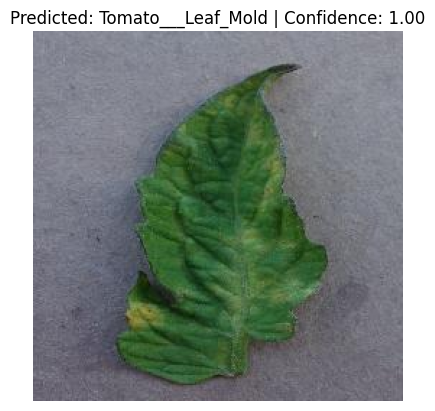

In [ ]:
# Test Gambar Dataset
# Fungsi untuk prediksi gambar
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/Tomato___Leaf_Mold/022a4dfb-84cc-45cb-81c5-a620817e31cb___Crnl_L.Mold 6926.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


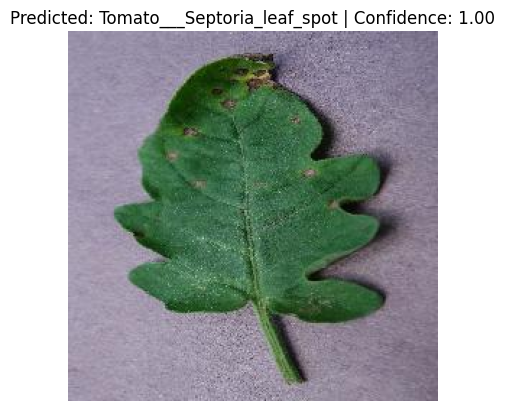

In [ ]:
# Test Gambar Dataset
# Fungsi untuk prediksi gambar
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/Tomato___Septoria_leaf_spot/009bb542-f0c0-40f2-98a7-f547c5adec45___Matt.S_CG 1355.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


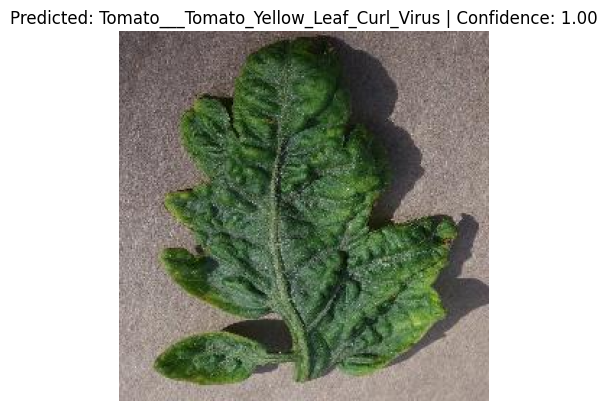

In [ ]:
# Test Gambar Dataset
# Fungsi untuk prediksi gambar
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/Tomato___Tomato_Yellow_Leaf_Curl_Virus/0402077e-1231-48b4-8aa6-3a9c492dc7e6___YLCV_GCREC 2163.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


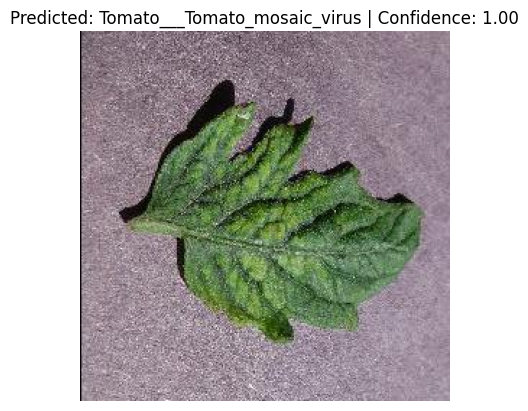

In [ ]:
# Test Gambar Dataset
# Fungsi untuk prediksi gambar
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/Tomato___Tomato_mosaic_virus/0befa341-0db3-49f4-b4fc-beeb05854bff___PSU_CG 2338_270deg.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


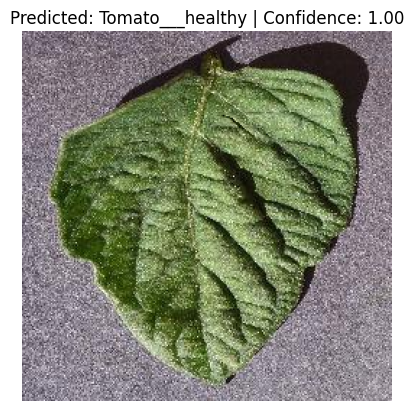

In [ ]:
# Test Gambar Dataset
# Fungsi untuk prediksi gambar
from tensorflow.keras.preprocessing import image

def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/Tomato___healthy/00bce074-967b-4d50-967a-31fdaa35e688___RS_HL 0223_180deg.JPG'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


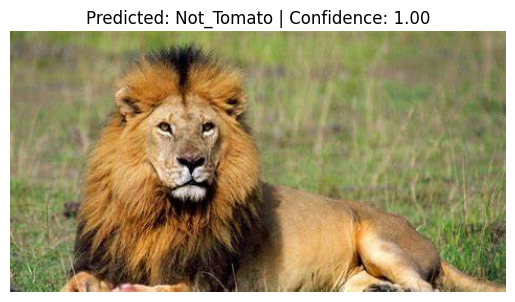

In [ ]:
#Test Gambar Baru
# Fungsi untuk prediksi gambar
def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/lion.jpg'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


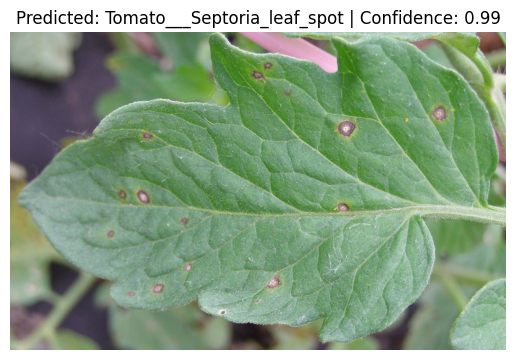

In [ ]:
#Test Gambar Baru
# Fungsi untuk prediksi gambar
def predict_image(img_path, model, img_size):
    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Menambah dimensi untuk batch size
    img_array /= 255.0  # Normalisasi
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction)  # Kelas yang diprediksi
    confidence = prediction[0][pred_class]  # Kepercayaan model terhadap prediksi
    return pred_class, confidence

# Fungsi untuk menampilkan gambar dan hasil prediksi
def display_image_and_prediction(img_path, pred_class, confidence, class_names):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {class_names[pred_class]} | Confidence: {confidence:.2f}')
    plt.show()

# Coba prediksi gambar tertentu
img_path = '/content/tomato-septoria-leaf-spot-grabowski.jpg'
pred_class, confidence = predict_image(img_path, model, img_size)

# Daftar nama kelas yang ada pada model
class_names = list(test_generator.class_indices.keys())

# Tampilkan gambar dan hasil prediksi
display_image_and_prediction(img_path, pred_class, confidence, class_names)

In [ ]:
# Save the fine-tuned model
model.save('Final Tomato MobileNetV2 model2.h5')